## Problem: Predicting heart disease
## Methodology: t-distributed Stochastic Neighbor Embedding (t-SNE)
## Data: Heart disease dataset from the UC Irvine Machine Learning
### t-SNE algorithm analyzes a dataset's features and reduces them to the specific number of dimensions.

### Like PCA, t-SNE is a dimensionality reduction technique that tries to find a good representation of the high-dimensional data in the low-dimensional space. In order to accomplish this, t-SNE measures the similarity between the data points both in high-dimensional space and low-dimensional space and then tries to minimize the divergence between the two similarities calculated in the high and the low dimensional spaces. 

PCA tries to preserve the large pairwise distances between the data points whereas t-SNE tries to preserve the small pairwise distances between them. Hence, t-SNE better represents the local similarities in the data whereas PCA better represents the dissimilarities in the data. 

PCA is a linear method that tries to retain the variance in the data as much as it can whereas t-SNE is a non-linear method that minimizes the divergence between the distributions of high-dimensional data and the low-dimensional representation it produces. 

Here's how t-SNE works 
The t-SNE algorithm follows these steps:

1. Measure the Gaussian similarity between all points, by calculating the Euclidean (spatial) distance between points and then calculating the value of a Gaussian curve at that distance.
2. Position the data points in the lower dimensional space in a random fashion.
3. Calculate the t-similarity between all the points in the lower dimensional space.
4. Optimize the positions of the data points in the lower dimensional space by following the gradient of a loss function. 5. Adjust the data points in the lower dimensional space by using gradient descent, moving points that were close in the high-dimensional data closer together and moving points that were further away further from each other:


#### How DBSCAN works:
##### Out of n unvisited sample data points, we'll first move through each point in a loop and mark each one as visited.
##### From each point, we'll look at the distance to every other point in the dataset.
##### All points that fall within the neighborhood radius hyperparameter should be considered as neighbors.
##### The number of neighbors should be at least as many as the minimum points required.
##### If the minimum point threshold is reached, the points should be grouped together as a cluster, or else marked as noise.
##### This process should be repeated until all data points are categorized in clusters or as noise.

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.patches import Patch
import matplotlib.patches as patches
import math
from numpy import percentile
from numpy.random import seed
import os
import datetime
import re
import pandas as pd
from sqlalchemy import create_engine
import seaborn as sns

In [3]:
# We load the MNIST OCR dataset below
mnist_OCR = fetch_openml('mnist_784', version=1, cache=True)

In [51]:
# We randomly sample 10000 images from MNIST for the sake of decreasing the computation time.
np.random.seed(123)

indices = np.random.choice(70000,10000)
X = mnist_OCR.data[indices] /255.0 # Divide by 255 to normalize for RGB (Red, Green, Blue) in image data
y = mnist_OCR.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


In [52]:
# As you see, the size of each image is 784. In fact, all images in MNIST are 28 by 28 pixels and 784 is just the result of the multiplication of 28 by 28. So, the data we have is a flattened version of the images where each row in the 28x28 matrix is concatenated side by side.

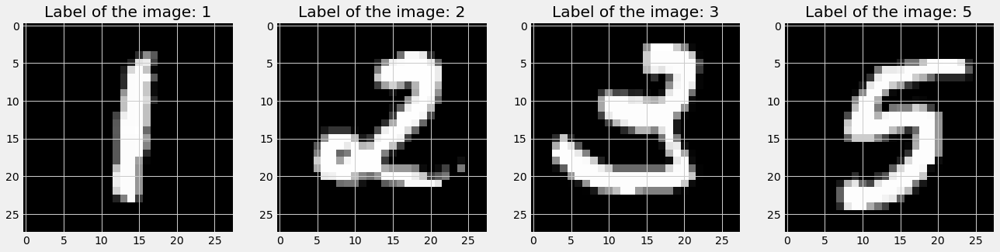

In [53]:
# Inspect few of them
plt.figure(figsize=(20,5))

plt.subplot(141)
plt.imshow(X[123].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[123]))

plt.subplot(142)
plt.imshow(X[124].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[124]))

plt.subplot(143)
plt.imshow(X[125].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[125]))

plt.subplot(144)
plt.imshow(X[126].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[126]))

plt.show()

### Apply t-SNE. Since, we want to visualize the MNIST data in two-dimensions, we set n_components=2 in the TSNE class. We also set perplexity=40 and n_iter=300. You can play with the perplexity and the number of iterations and compare the results.

In [55]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 2.146s...
[t-SNE] Computed neighbors for 10000 samples in 122.082s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.182897
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.249634
[t-SNE] KL divergence after 300 iterations: 2.808112
t-SNE done! Time elapse

In [40]:
## Plot the MNIST data using the t-SNE components. In the figure below

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [44]:
## Because the t-SNE preserves the local similarities all the classes seem to be separated from each other quite well.

# Try different dataset: Fashion MNIST
## This image dataset comprises 70,000 grayscale 28x28 images. The dataset contains the following 10 classes:
### T-shirt/top, Trouser/pants, Pullover shirt, Dress, Coat, Sandal, Shirt, Sneaker, Bag and Ankle boot.

In [59]:
from sklearn.datasets import fetch_openml
mnist_fashion = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [60]:
# We randomly sample 10000 images from MNIST for the sake of decreasing the computation time.
np.random.seed(123)

indices = np.random.choice(70000,10000)
X = mnist_fashion.data[indices] / 255.0 # Divide by 255 to normalize for RGB (Red, Green, Blue) in image data
y = mnist_fashion.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


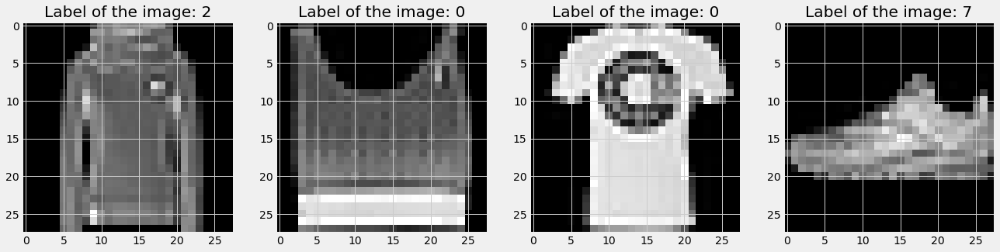

In [61]:
# Inspect few of them
plt.figure(figsize=(20,5))

plt.subplot(141)
plt.imshow(X[123].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[123]))

plt.subplot(142)
plt.imshow(X[124].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[124]))

plt.subplot(143)
plt.imshow(X[125].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[125]))

plt.subplot(144)
plt.imshow(X[126].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[126]))

plt.show()

## Apply PCA before t-SNE

In [65]:
# Normalize the data
from sklearn.preprocessing import normalize 
X_norm = normalize(X)
# Apply PCA and visualize the MNIST data in two-dimentional space
# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X_norm)

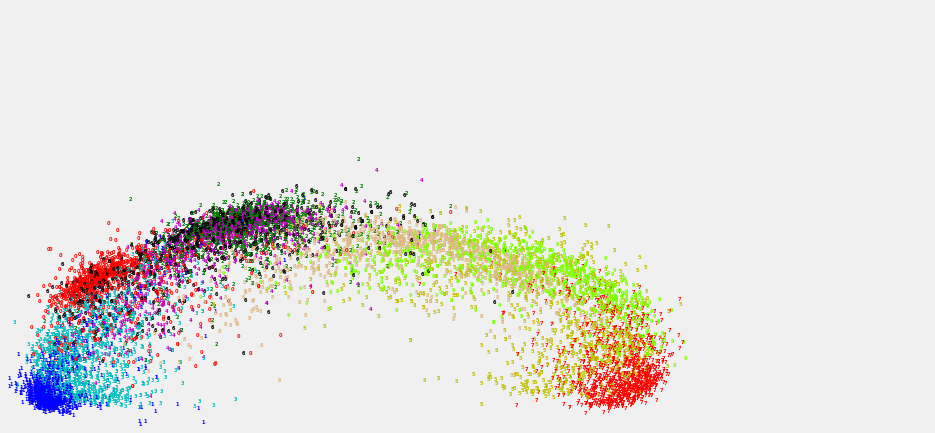

In [66]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 5}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### Apply t-SNE. Since, we want to visualize the MNIST data in two-dimensions, we set n_components=2 in the TSNE class. We also set perplexity=40 and n_iter=300. You can play with the perplexity and the number of iterations and compare the results.

In [67]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 2.108s...
[t-SNE] Computed neighbors for 10000 samples in 130.282s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.836341
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.879730
[t-SNE] KL divergence after 300 iterations: 2.506390
t-SNE done! Time elapse

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

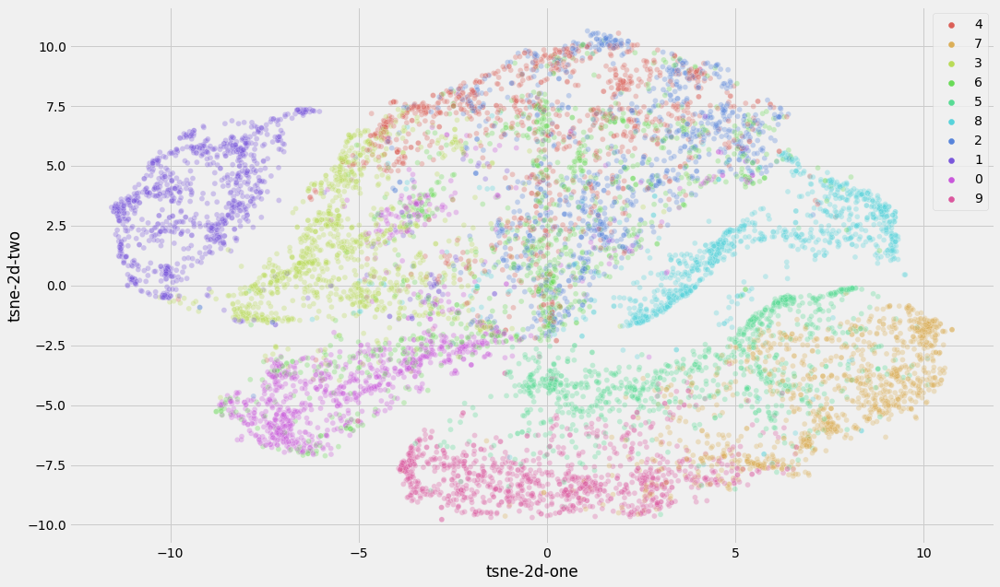

In [73]:
df_subset = pd.DataFrame()
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue=y,
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

### There are less overlapping when using t_SNE compared to PCA resulting in better observation of certain clusters.

In [ ]:
## Hypertune t-SNE 
## "Perplexity” is a tuneable parameter which loosely is about the balance between local and global aspects of the dataset. A kind of a guess about the number of close neighbors each point has. The perplexity value has a complex effect on the resulting pictures. Let's try a different value.

In [76]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=20, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 10000 samples in 2.103s...
[t-SNE] Computed neighbors for 10000 samples in 127.377s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.627323
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.296555
[t-SNE] KL divergence after 300 iterations: 3.004034
t-SNE done! Time elapsed

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

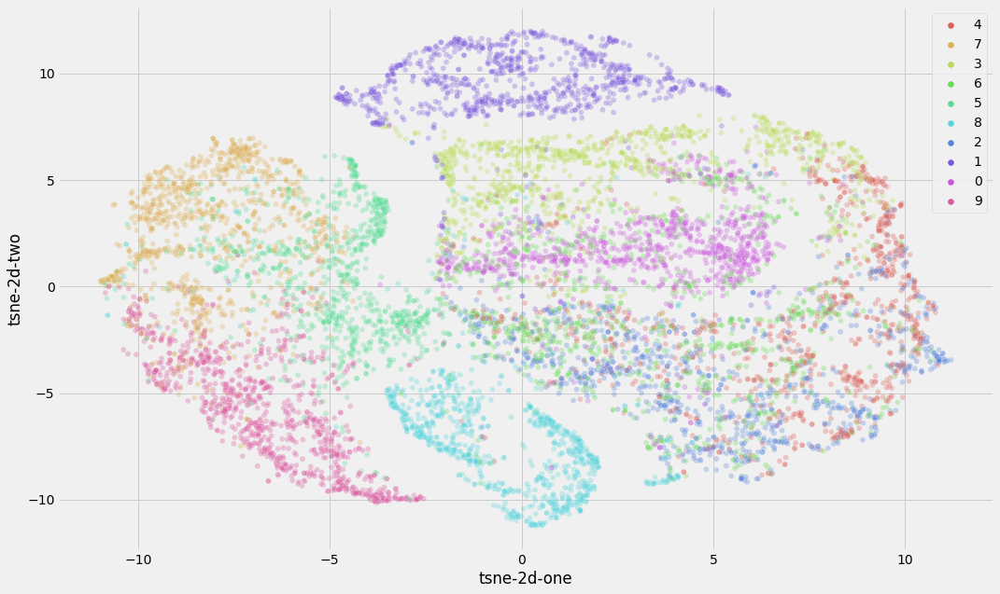

In [77]:
df_subset = pd.DataFrame()
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue=y,
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

## Reducing the perplexity from 40 to 20 did not help. Let's try a bigger number

In [78]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=60, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 10000 samples in 2.138s...
[t-SNE] Computed neighbors for 10000 samples in 131.070s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.963126
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.646385
[t-SNE] KL divergence after 300 iterations: 2.237734
t-SNE done! Time elapse

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

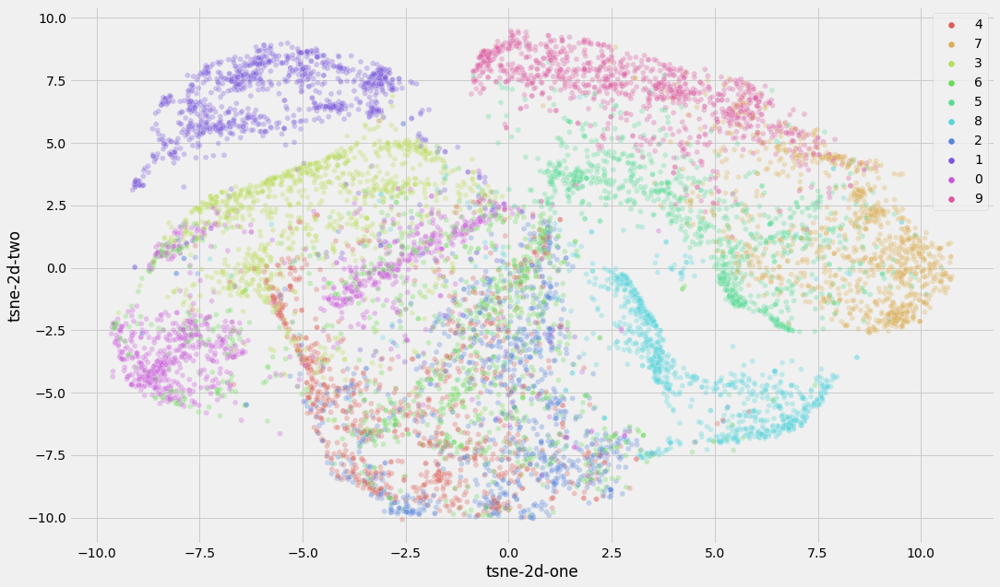

In [79]:
df_subset = pd.DataFrame()
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue=y,
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

## Increasing the perplexity from 40 to 60 did not help. Let's try a bigger number